# Conversion of ilastik outputs (.h5) into binary masks and quality-control reports

**Purpose:** This notebook converts segmentation outputs from ilastik (`.h5` probability maps) into binary mask formats (e.g., `.png`/NumPy), applies thresholding per class, performs optional morphological cleaning, and generates visualization reports for quality control.

**Functionality:**
- Mounting the workspace (Google Drive / local execution),
- User parameter definition (object/class names, thresholds, paths),
- Automatic detection of `.h5` files in input directories,
- Conversion into binary masks using thresholds,
- Optional operations (e.g., class merging, morphological filtering),
- Saving results and generating preview/summary reports.

**Input:** `.h5` files exported from ilastik (probability maps).  
**Output:** Binary masks and preview reports for quality control.

---

ATTENTION ! This mask are not finally used in U-Net. This mask are load into Ilastik and within Ilastik there are final manual tuning made. Afterwards,
there is a final conversion done. Such a multi-step proceessing  provides a high-quality-mask for U-Net.

---

> Note: User-specific parameters are defined in the “USER PARAMETERS” section.

In [1]:
# ------------------------------
# STEP 0: Mount Google Drive
# ------------------------------

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Batch 1 - list of images and thresholds per image FOR GFM
# ATTENTION: this section should be changed. List of images should be given in external text file and here only read-in.

#For GFM _it2
#file_thresholds = [
#('1AC_UT_GO_02_01_2000X_0002', 0.7),
#('2AC_UT_GO_02_01_2000X_0003', 0.7),
#('3AC_UT_GO_02_01_2000X_0004', 0.7),
#('4AC_UT_GO_02_01_2000X_0005', 0.7),
#('AC_UT_GO 06_03_2000X_0001', 0.7),
#('AC_UT_GO 06_03_2000X_0004', 0.6),
#('AC_UT_GO 02_03_2000X_0002', 0.5),
#('AC_UT_GO_02_04_2000X_0001', 0.9),
#('AC_UT_GO_02_04_2000X_0003', 0.7),
#('AC_UT_G_03_01_UO_200X_0002', 0.7),
#('AC_UT_G_03_01_UO_200X_0008', 0.7),
#('AC_UT_G_04_01_UO_200X_0001', 0.7),
#('AC_UT_G_04_01_UO_200X_0002', 0.7),
#('AC_UT_G_04_01_UO_200X_0003', 0.7),
#('AC_UT_G_04_01_UO_200X_0005', 0.7),
#('AC_UT_G_04_01_UO_200X_0006', 0.7),
#('AC_UT_G_04_01_UO_200X_0007', 0.7),
#('AC_UT_G_04_01_UO_200X_0008', 0.7),
#('AC_UT_G_04_01_UO_200X_0009', 0.7),
#('AC_UT_G_04_01_UO_200X_0010', 0.7),
#('AC_UT_G_01_01_UO_200X_0006', 0.7),
#('AC_UT_G_01_01_UO_200X_0008', 0.7),
#('AC_UT_G_01_01_UO_200X_0009', 0.7),
#('AC_UT_G_02_01_UO_2000X_0001', 0.6),
#('AC_UT_G_02_01_UO_2000X_0002', 0.6),
#('AC_UT_G_02_01_UO_2000X_0003', 0.7),
#('AC_UT_G_02_01_UO_2000X_0005', 0.7),
#('AC_UT_G_02_01_UO_2000X_0006', 0.7),
#('AC_UT_G_02_01_UO_2000X_0007', 0.7),
#('AC_UT_G_02_01_UO_2000X_0008', 0.6),
#('AC_UT_G_02_01_UO_2000X_0009', 0.95)]


# Batch 3 - list of images and thresholds per image FOR GFM
file_thresholds = [
('1AC_UT_GO_02_01_2000X_0002', 0.7),
('AC_UT_G_04_01_UO_200X_0001', 0.5),
('AC_UT_G_04_01_UO_200X_0002', 0.65),
('AC_UT_G_04_01_UO_200X_0003', 0.5),
('AC_UT_G_04_01_UO_200X_0005', 0.5),
('AC_UT_G_04_01_UO_200X_0006', 0.5),
('AC_UT_G_04_01_UO_200X_0007', 0.65),
('AC_UT_G_04_01_UO_200X_0008', 0.7),
('AC_UT_G_04_01_UO_200X_0009', 0.5),
('AC_UT_G_04_01_UO_200X_0010', 0.65)]

# Normalize names (replace spaces with underscores)
threshold_dict = {name.replace(" ", "_"): thresh for name, thresh in file_thresholds}

In [3]:
# Batch 1 - list of images and thresholds per image for carbonholes
#file_thresholds = [
#('1AC_UT_GO_02_01_2000X_0002', 0.7),
#('2AC_UT_GO_02_01_2000X_0003', 0.7),
#('3AC_UT_GO_02_01_2000X_0004', 0.7),
#('4AC_UT_GO_02_01_2000X_0005', 0.7),
#('AC_UT_GO 06_03_2000X_0001', 0.7),
#('AC_UT_GO 06_03_2000X_0004', 0.6),
#('AC_UT_GO 02_03_2000X_0002', 0.5),
#('AC_UT_GO_02_04_2000X_0001', 0.95),
#'AC_UT_GO_02_04_2000X_0003', 0.95),
#('AC_UT_G_03_01_UO_200X_0002', 0.8),
#('AC_UT_G_03_01_UO_200X_0008', 0.8),
#('AC_UT_G_04_01_UO_200X_0001', 0.7),
#('AC_UT_G_04_01_UO_200X_0002', 0.7),
#('AC_UT_G_04_01_UO_200X_0003', 0.7),
#('AC_UT_G_04_01_UO_200X_0005', 0.7),
#('AC_UT_G_04_01_UO_200X_0006', 0.7),
#('AC_UT_G_04_01_UO_200X_0007', 0.7),
#('AC_UT_G_04_01_UO_200X_0008', 0.7),
#('AC_UT_G_04_01_UO_200X_0009', 0.7),
#('AC_UT_G_04_01_UO_200X_0010', 0.7),
#('AC_UT_G_01_01_UO_200X_0006', 0.7),
#('AC_UT_G_01_01_UO_200X_0008', 0.7),
#('AC_UT_G_01_01_UO_200X_0009', 0.7),
#('AC_UT_G_02_01_UO_2000X_0001', 0.9),
#('AC_UT_G_02_01_UO_2000X_0002', 0.9),
#('AC_UT_G_02_01_UO_2000X_0003', 0.9),
#('AC_UT_G_02_01_UO_2000X_0005', 0.9),
#('AC_UT_G_02_01_UO_2000X_0006', 0.9),
#('AC_UT_G_02_01_UO_2000X_0007', 0.9),
#('AC_UT_G_02_01_UO_2000X_0008', 0.9),
#('AC_UT_G_02_01_UO_2000X_0009', 0.9)
#]

# Normalize names (replace spaces with underscores)
threshold_dict = {name.replace(" ", "_"): thresh for name, thresh in file_thresholds}

In [4]:
# Batch 1 - list of images and thresholds per image FOR UNDEFINED
#For undefined (this is the Batch_1 set)
file_thresholds = [
('1AC_UT_GO_02_01_2000X_0002', 0.6),
('2AC_UT_GO_02_01_2000X_0003', 0.6),
('3AC_UT_GO_02_01_2000X_0004', 0.6),
('4AC_UT_GO_02_01_2000X_0005', 0.6),
('AC_UT_GO_06_03_2000X_0001', 0.6),
('AC_UT_GO_06_03_2000X_0002', 0.6)
]

# Normalize names (replace spaces with underscores)
threshold_dict = {name.replace(" ", "_"): thresh for name, thresh in file_thresholds}

## Step 1: User parameters and paths

In this section, the user specifies the main processing parameters:

- **`object_name`**: the target class to be extracted from ilastik probability maps (e.g., `"carbonhole"`, `"GFM"`, `"flake"`).  
- **`threshold`**: probability cutoff for converting soft probability maps into binary masks (optional, currently commented).  
- **`h5_subdir`**: subdirectory under the working folder where the ilastik `.h5` files are located.  

Paths for input and output are automatically constructed:  
- **`h5_folder_path`**: full path to the `.h5` files.  
- **`output_dir`**: directory where overlay visualizations will be saved.  
- **`mask_png_dir`**: directory for saving binary masks in PNG format.  
- **`mask_npy_dir`**: directory for saving binary masks in NumPy (`.npy`) format.  

All required output directories are created if they do not already exist.


In [10]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from cv2 import resize, INTER_LINEAR
from pathlib import Path

# ==== USER PARAMETERS ====
object_name = "GFM_it3"                    # e.g., "carbonhole", "GFM", "flake"
# threshold = 0.7                          # probability threshold for mask
h5_subdir = '/content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/h5_files_iteration2'    # subfolder under 'folder_path' where .h5 files are stored

# ==== PATHS ====
folder_path = '/content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/'
input_dirs = [
    '/content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/'
    #'/content/drive/MyDrive/02 ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/26_06_2025_G_images_batchprocessing/'
]

h5_folder_path = os.path.join(folder_path, h5_subdir)
output_dir = os.path.join(folder_path, f'overlay_{object_name}')
mask_png_dir = os.path.join(folder_path, f'masks_png_{object_name}')
mask_npy_dir = os.path.join(folder_path, f'masks_npy_{object_name}')

os.makedirs(output_dir, exist_ok=True)
os.makedirs(mask_png_dir, exist_ok=True)
os.makedirs(mask_npy_dir, exist_ok=True)

## Step 2: File detection

This section scans the input directories to identify the files needed for processing:

- **`.h5` files**: ilastik probability maps with filenames matching the pattern  
  `_Probabilities_{object_name}.h5`.  
- **Image candidates**: raw microscopy images (supported formats: `.tif`, `.tiff`, `.png`, `.jpg`), used for overlay visualization.  

The script prints how many `.h5` files were found for the specified `object_name` in the chosen subdirectory.


In [11]:
# ==== FILE DETECTION ====
h5_files = []
for input_dir in input_dirs:
    subdir_path = os.path.join(input_dir, h5_subdir)
    if os.path.exists(subdir_path):
        h5_files += [(f, subdir_path) for f in os.listdir(subdir_path) if f.endswith(f'_Probabilities_{object_name}.h5')]

image_candidates = []
for input_dir in input_dirs:
    image_candidates += [(f, input_dir) for f in os.listdir(input_dir) if f.lower().endswith(('.tif', '.tiff', '.png', '.jpg'))]

print(f"🔍 Found {len(h5_files)} .h5 files for object '{object_name}' in folder '{h5_subdir}'.\\n")

# Create the threshold dictionary from the file_thresholds list
threshold_dict = dict(file_thresholds)

h5_files

🔍 Found 0 .h5 files for object 'GFM_it3' in folder '/content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/h5_files_iteration2'.\n


[]

## Step 3: Main processing loop

For each `.h5` probability map:

1. **File preparation**  
   - Extracts the basename (without the `_Probabilities_{object_name}.h5` suffix).  
   - Normalizes the name for dictionary lookup.  
   - Skips the file if no threshold is defined in `threshold_dict`.  

2. **Probability map loading**  
   - Opens the `.h5` file and loads the dataset `exported_data`.  
   - Assumes binary classification: channel `0` = background, channel `1` = object of interest.  
   - Selects the object channel as the probability map.  

3. **Image matching (next step)**  
   - Searches for the corresponding raw image for later overlay generation.  

### Step 3a: Thresholding, saving masks, and generating overlays

For each `.h5` probability map:

- **Image matching & resizing**  
  The corresponding raw image is loaded (RGB). If the probability map shape differs from the image spatial size, it is resized to match the image dimensions.

- **Binarization**  
  The resized probability map is thresholded with the per-file threshold from `threshold_dict`:
  \[
  \text{mask}(x,y) = \mathbb{1}[\;p(x,y) > \tau\;]
  \]
  The resulting binary mask is saved as:
  - **PNG** (values 0 or 255), and
  - **NumPy** (`.npy`, values 0 or 1).

- **Overlay visualization**  
  A red overlay is created by blending the original image with a red layer at the mask locations (simple 50/50 blend). This provides an immediate quality-control view.

- **Figure & export**  
  A 3-panel figure is produced:
  1) Original image  
  2) Red overlay  
  3) Probability map (with colorbar; `cmap="turbo"`, `vmin=0.4`, `vmax=1.0`)  
  The figure is saved to `output_dir` as `*_overlay_plot_{object_name}.png`.


🔄 Processing: AC_UT_G_04_01_UO_200X_0001_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0001'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0001_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0001_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0001_mask_GFM_it3.npy


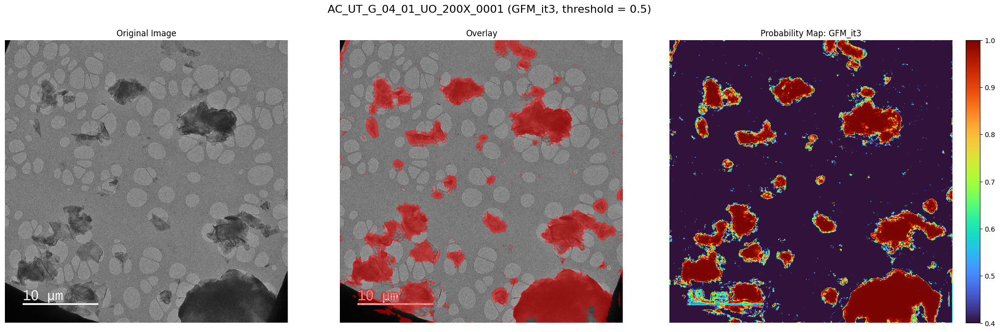

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0001_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0002_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0002'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0002_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0002_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0002_mask_GFM_it3.npy


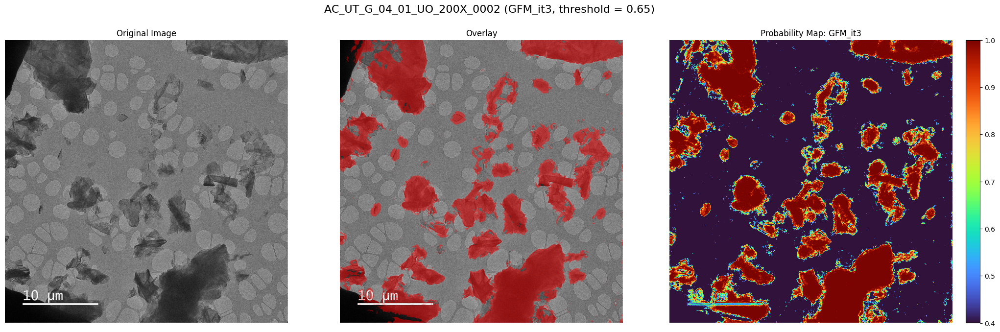

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0002_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0003_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0003'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0003_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0003_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0003_mask_GFM_it3.npy


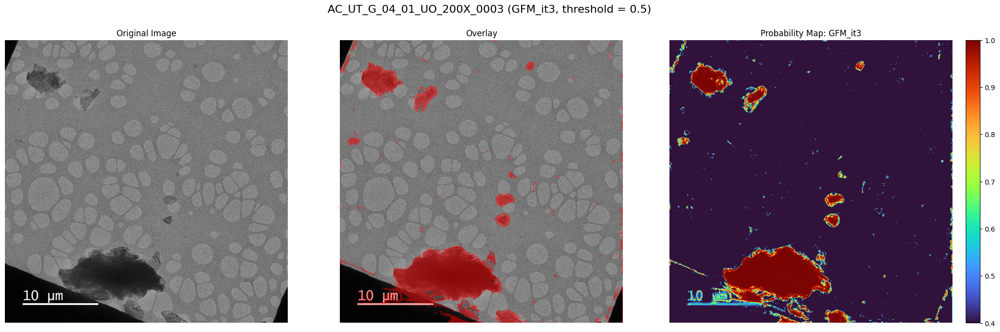

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0003_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0005_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0005'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0005_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0005_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0005_mask_GFM_it3.npy


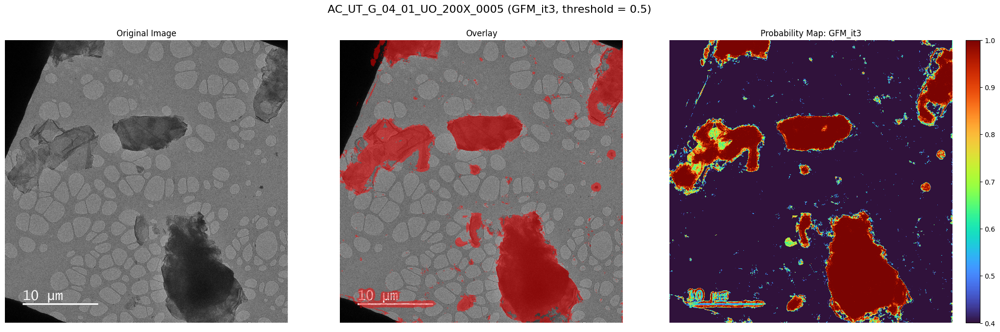

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0005_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0006_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0006'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0006_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0006_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0006_mask_GFM_it3.npy


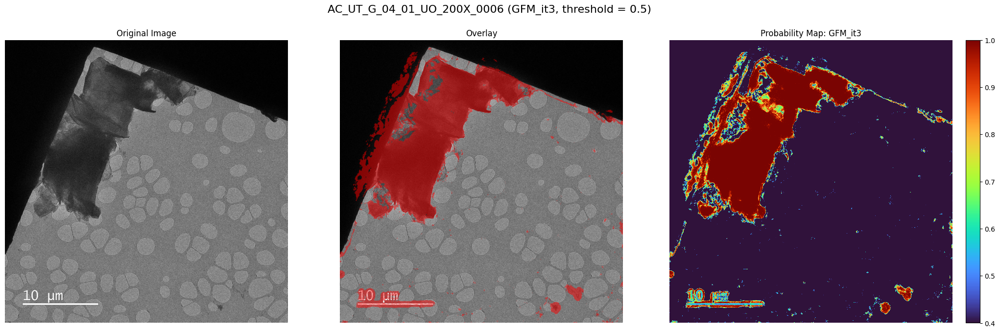

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0006_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0007_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0007'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0007_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0007_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0007_mask_GFM_it3.npy


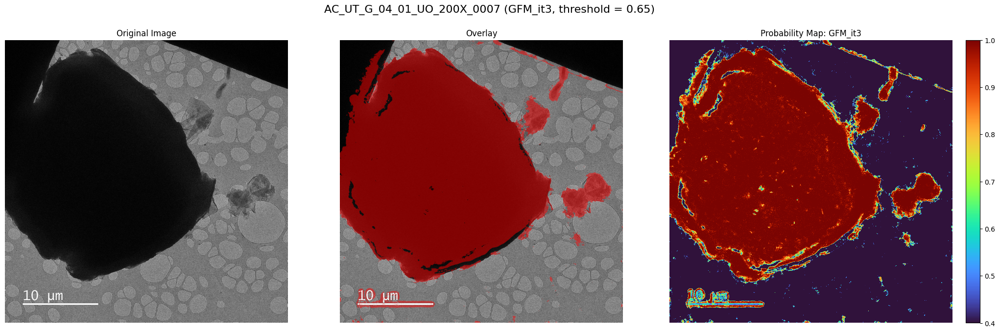

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0007_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0008_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0008'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0008_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0008_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0008_mask_GFM_it3.npy


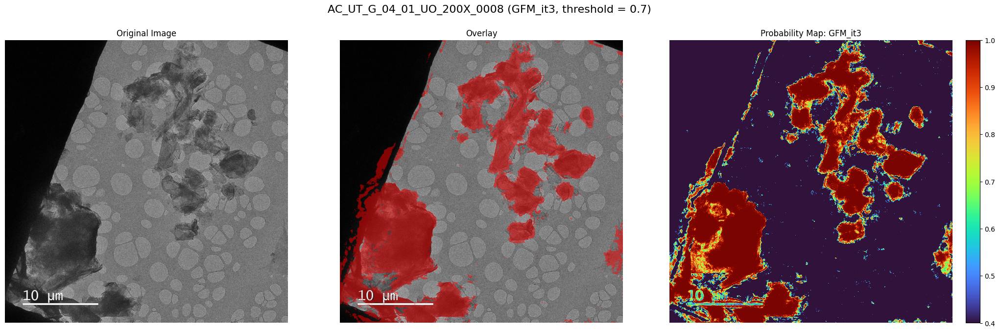

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0008_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0009_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0009'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0009_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0009_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0009_mask_GFM_it3.npy


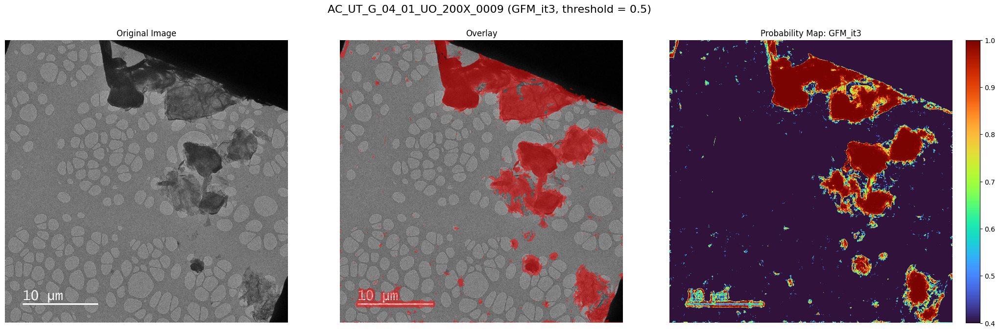

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0009_overlay_plot_GFM_it3.png
🔄 Processing: AC_UT_G_04_01_UO_200X_0010_Probabilities_GFM_it3.h5
    ↳ Threshold key: 'AC_UT_G_04_01_UO_200X_0010'
    ↳ Matched original image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/AC_UT_G_04_01_UO_200X_0010_original.tif
💾 Saved mask PNG: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_png_GFM_it3/AC_UT_G_04_01_UO_200X_0010_mask_GFM_it3.png
💾 Saved mask NPY: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/masks_npy_GFM_it3/AC_UT_G_04_01_UO_200X_0010_mask_GFM_it3.npy


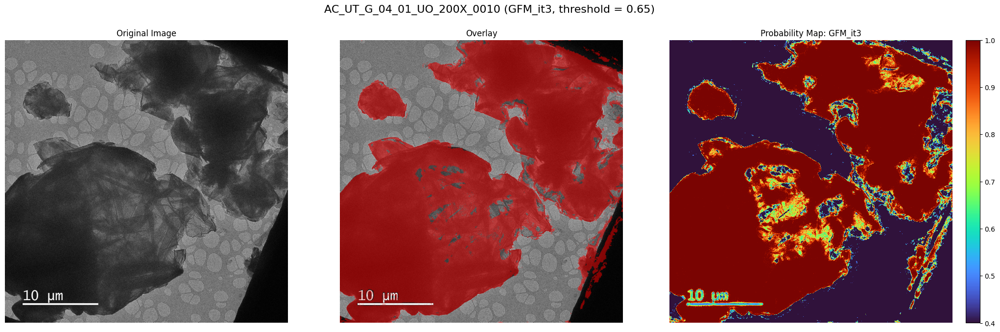

✅ Saved overlay image: /content/drive/MyDrive/02 ACCORDS/ACC_ImageCharacterisation/notebooks/ilastik/images_normalized/overlay_GFM_it3/AC_UT_G_04_01_UO_200X_0010_overlay_plot_GFM_it3.png


In [9]:
# ==== MAIN LOOP ====
for h5_filename, h5_folder_path in h5_files:
    h5_basename = h5_filename.replace(f'_Probabilities_{object_name}.h5', '')
    h5_file_path = os.path.join(h5_folder_path, h5_filename)

    # Normalize name for dictionary lookup
    normalized_name = h5_basename.replace(" ", "_")
    if normalized_name not in threshold_dict:
        print(f"⚠️ Skipping {h5_filename} — no threshold for '{normalized_name}'")
        continue

    threshold = threshold_dict[normalized_name]

    # === Load probability map from .h5 ===
    with h5py.File(h5_file_path, 'r') as f:
        prob_data = np.array(f['exported_data'])  # shape: (H, W, C)
    prob_map = prob_data[..., 1]  # assuming binary classification (background, object)

    # === Match original image ===
    original_image_path = None
    for candidate_filename, candidate_folder in image_candidates:
        if candidate_filename.startswith(h5_basename):
            original_image_path = os.path.join(candidate_folder, candidate_filename)
            break

    if original_image_path is None:
        print(f"❌ Skipping {h5_filename} — no matching original image file found for basename '{h5_basename}'")
        continue

    if not os.path.exists(original_image_path):
        print(f"❌ Skipping {h5_filename} — matched image path does not exist: {original_image_path}")
        continue

    print(f"🔄 Processing: {h5_filename}")
    print(f"    ↳ Threshold key: '{normalized_name}'")
    print(f"    ↳ Matched original image: {original_image_path}")

    original_image = Image.open(original_image_path).convert("RGB")
    original_array = np.array(original_image)

    # Resize probability map if needed
    if prob_map.shape != original_array.shape[:2]:
        resized_prob = resize(prob_map, (original_array.shape[1], original_array.shape[0]), interpolation=INTER_LINEAR)
    else:
        resized_prob = prob_map

    # Generate binary mask
    mask = resized_prob > threshold
    binary_mask = mask.astype(np.uint8)

    # === Save masks ===
    mask_png_path = os.path.join(mask_png_dir, h5_basename + f'_mask_{object_name}.png')
    Image.fromarray(binary_mask * 255).save(mask_png_path)

    mask_npy_path = os.path.join(mask_npy_dir, h5_basename + f'_mask_{object_name}.npy')
    np.save(mask_npy_path, binary_mask)

    print(f"💾 Saved mask PNG: {mask_png_path}")
    print(f"💾 Saved mask NPY: {mask_npy_path}")

    # === Generate overlay ===
    red_layer = np.zeros_like(original_array)
    red_layer[..., 0] = 255  # red only
    mask_3d = np.stack([mask] * 3, axis=-1)
    overlay_array = np.where(mask_3d, original_array * 0.5 + red_layer * 0.5, original_array).astype(np.uint8)

    # === Display and save plots ===
    fig, axs = plt.subplots(1, 3, figsize=(21, 7))
    fig.suptitle(f"{h5_basename} ({object_name}, threshold = {threshold})", fontsize=16)

    axs[0].imshow(original_array)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(overlay_array)
    axs[1].set_title("Overlay")
    axs[1].axis("off")

    im = axs[2].imshow(resized_prob, cmap='turbo', interpolation='nearest', vmin=0.4, vmax=1.0)
    axs[2].set_title(f"Probability Map: {object_name}")
    axs[2].axis("off")
    fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.04)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()  # Live preview in Jupyter

    save_path = os.path.join(output_dir, h5_basename + f'_overlay_plot_{object_name}.png')
    fig.savefig(save_path, dpi=200)
    plt.close(fig)

    print(f"✅ Saved overlay image: {save_path}")
